# Conditional Wasserstein Generative Adversarial Network

### Import modules

In [5]:
import os
from pathlib import Path

# Import glob to get the files directories recursively
import glob

# Import Garbage collector interface
import gc 

# Import OpenCV to transforme pictures
import cv2

# Import Time
import time

# import numpy for math calculations
import numpy as np

# Import pandas for data (csv) manipulation
import pandas as pd

# Import matplotlib for plotting
import matplotlib.pyplot as plt
import matplotlib
matplotlib.style.use('fivethirtyeight') 
%matplotlib inline

import PIL
from PIL import Image
from skimage.color import rgb2lab, lab2rgb

import pytorch_lightning as pl

# Import pytorch to build Deel Learling Models 
import torch
from torch import nn, optim
from torchvision import transforms
from torch.utils.data import Dataset, DataLoader
from torch.autograd import Variable
from torchvision import models
from torch.nn import functional as F
import torch.utils.data
from torchvision.models.inception import inception_v3
from scipy.stats import entropy

#from torchsummary import summary

# Import tqdm to show a smart progress meter
from tqdm import tqdm

# Import warnings to hide the unnessairy warniings
import warnings
warnings.filterwarnings('ignore')

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

### Set the dataset path

In [6]:

ab_path = "/kaggle/input/image-colorization-v3/Color_images_7000.npy"
l_path = "/kaggle/input/image-colorization-v3/Color_to_infrared_7000.npy"

In [7]:
ab_df = np.load(ab_path)
L_df = np.load(l_path)
dataset = (L_df,ab_df )
gc.collect()

26

In [8]:
ab_df.shape,L_df.shape

((7000, 224, 224, 3), (7000, 224, 224))

### Plotting unprocessed images

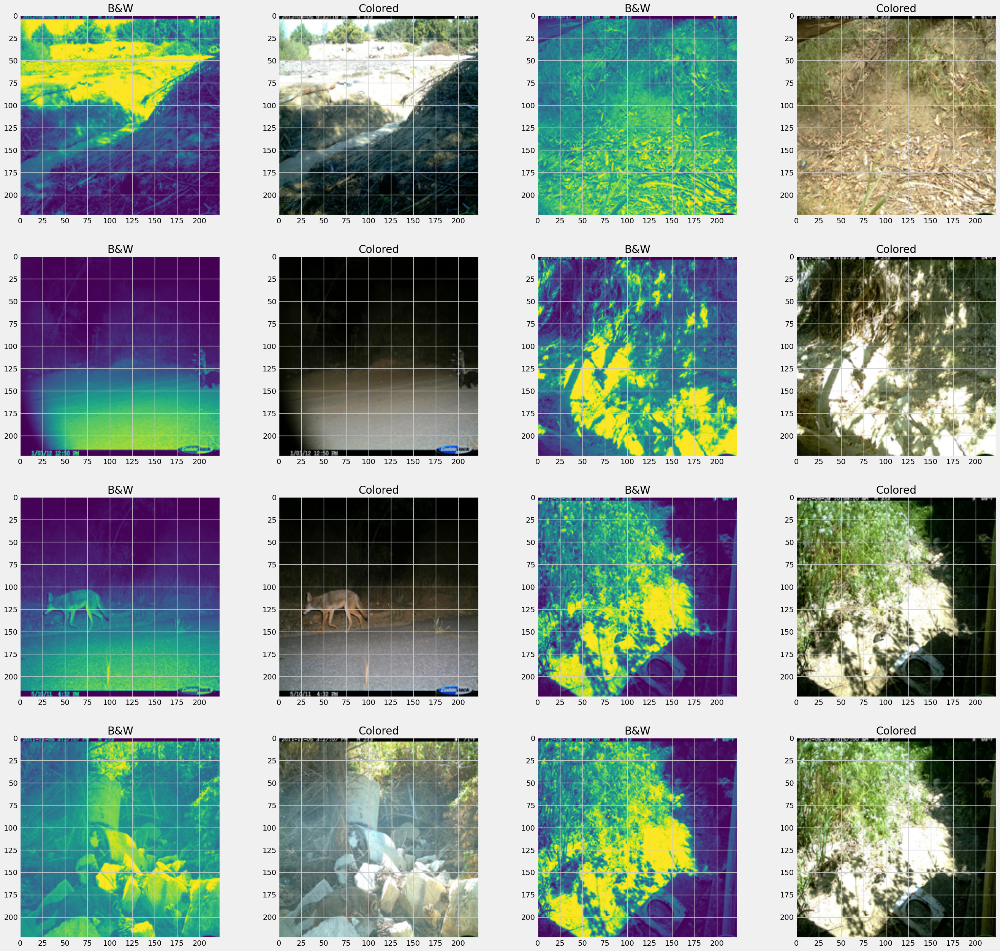

In [9]:
plt.figure(figsize=(30,30))
for i in range(1,16,2):
    plt.subplot(4,4,i)
    plt.title('B&W')
    plt.imshow(L_df[i])
    
    plt.subplot(4,4,i+1)
    plt.title('Colored')
    plt.imshow(ab_df[i])

### Setting up the dataloader

In [11]:
class ImageColorizationDataset(Dataset):
    ''' Black and White (L) Images and corresponding A&B Colors'''
    def __init__(self, dataset, transform=None):
        '''
        :param dataset: Dataset name.
        :param data_dir: Directory with all the images.
        :param transform: Optional transform to be applied on sample
        '''
        self.dataset = dataset
        self.transform = transform
    
    def __len__(self):
        return len(self.dataset[0])
    
    def __getitem__(self, idx):
        L = np.array(dataset[0][idx]).reshape((224,224,1))
        L = transforms.ToTensor()(L)
        
        ab = np.array(dataset[1][idx])
        ab = transforms.ToTensor()(ab)

        return ab, L

###  Train Test Split

In [13]:
batch_size = 1

# Prepare the Datasets
train_dataset = ImageColorizationDataset(dataset = (L_df, ab_df))
test_dataset = ImageColorizationDataset(dataset = (L_df[:1000], ab_df[:1000]))

# Build DataLoaders
train_loader = DataLoader(dataset=train_dataset, batch_size=batch_size, shuffle = True, pin_memory = True)
test_loader = DataLoader(dataset=test_dataset, batch_size=batch_size, shuffle = True, pin_memory = True)

### Setting up the residual block

In [14]:
class ResBlock(nn.Module):
    def __init__(self, in_channels, out_channels, stride=1):
        super().__init__()
        self.layer = nn.Sequential(
            nn.Conv2d(in_channels,out_channels,kernel_size=3, padding=1, stride=stride, bias=False),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True),
            nn.Conv2d(out_channels, out_channels,kernel_size=3,padding=1, stride=1, bias=False),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True)
        )

        self.identity_map = nn.Conv2d(in_channels, out_channels,kernel_size=1,stride=stride)
        self.relu = nn.ReLU(inplace=True)
    def forward(self, inputs):
        x = inputs.clone().detach()
        out = self.layer(x)
        residual  = self.identity_map(inputs)
        skip = out + residual
        return self.relu(skip)

### Setting up the downstream layers

In [16]:
class DownSampleConv(nn.Module):
    def __init__(self, in_channels, out_channels, stride=1):
        super().__init__()
        self.layer = nn.Sequential(
            nn.MaxPool2d(2),
            ResBlock(in_channels, out_channels)
        )

    def forward(self, inputs):
        return self.layer(inputs)

### Setting up the upstream layers

In [17]:
class UpSampleConv(nn.Module):
    def __init__(self, in_channels, out_channels):
        super().__init__()
        
        self.upsample = nn.Upsample(scale_factor=2, mode="bilinear", align_corners=True)
        self.res_block = ResBlock(in_channels + out_channels, out_channels)
        
    def forward(self, inputs, skip):
        x = self.upsample(inputs)
        x = torch.cat([x, skip], dim=1)
        x = self.res_block(x)
        return x

### Setting up the generator architecture

In [18]:
class Generator(nn.Module):
    def __init__(self, input_channel, output_channel, dropout_rate = 0.2):
        super().__init__()
        self.encoding_layer1_ = ResBlock(input_channel,64)
        self.encoding_layer2_ = DownSampleConv(64, 128)
        self.encoding_layer3_ = DownSampleConv(128, 256)
        self.bridge = DownSampleConv(256, 512)
        self.decoding_layer3_ = UpSampleConv(512, 256)
        self.decoding_layer2_ = UpSampleConv(256, 128)
        self.decoding_layer1_ = UpSampleConv(128, 64)
        self.output = nn.Conv2d(64, output_channel, kernel_size=1)
        self.dropout = nn.Dropout2d(dropout_rate)
        
    def forward(self, inputs):
        ###################### Enocoder #########################
        e1 = self.encoding_layer1_(inputs)
        e1 = self.dropout(e1)
        e2 = self.encoding_layer2_(e1)
        e2 = self.dropout(e2)
        e3 = self.encoding_layer3_(e2)
        e3 = self.dropout(e3)
        
        ###################### Bridge #########################
        bridge = self.bridge(e3)
        bridge = self.dropout(bridge)
        
        ###################### Decoder #########################
        d3 = self.decoding_layer3_(bridge, e3)
        d2 = self.decoding_layer2_(d3, e2)
        d1 = self.decoding_layer1_(d2, e1)
        
        ###################### Output #########################
        output = self.output(d1)
        return output

### Setting up the discriminator architecture

In [19]:
class Critic(nn.Module):
    def __init__(self, in_channels=3):
        super(Critic, self).__init__()

        def critic_block(in_filters, out_filters, normalization=True):
            """Returns layers of each critic block"""
            layers = [nn.Conv2d(in_filters, out_filters, 4, stride=2, padding=1)]
            if normalization:
                layers.append(nn.InstanceNorm2d(out_filters))
            layers.append(nn.LeakyReLU(0.2, inplace=True))
            return layers

        self.model = nn.Sequential(
            *critic_block(in_channels, 64, normalization=False),
            *critic_block(64, 128),
            *critic_block(128, 256),
            *critic_block(256, 512),
            nn.AdaptiveAvgPool2d(1),
            nn.Flatten(),
            nn.Linear(512, 1)
        )

    def forward(self, ab, l):
        # Concatenate image and condition image by channels to produce input
        img_input = torch.cat((ab, l), 1)
        output = self.model(img_input)
        return output

### Model performance evaluation

In [20]:
gen = Generator(1,3).to(device)

In [21]:
desc = Critic(4).to(device)

In [22]:
gen.load_state_dict(torch.load("/kaggle/input/colorization-models/ResUnet_84.pt", map_location=device))
desc.load_state_dict(torch.load("/kaggle/input/colorization-models/PatchGAN_84.pt", map_location=device))

# Set to evaluation mode
gen.eval()
desc.eval()

Critic(
  (model): Sequential(
    (0): Conv2d(4, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (3): InstanceNorm2d(128, eps=1e-05, momentum=0.1, affine=False, track_running_stats=False)
    (4): LeakyReLU(negative_slope=0.2, inplace=True)
    (5): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (6): InstanceNorm2d(256, eps=1e-05, momentum=0.1, affine=False, track_running_stats=False)
    (7): LeakyReLU(negative_slope=0.2, inplace=True)
    (8): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (9): InstanceNorm2d(512, eps=1e-05, momentum=0.1, affine=False, track_running_stats=False)
    (10): LeakyReLU(negative_slope=0.2, inplace=True)
    (11): AdaptiveAvgPool2d(output_size=1)
    (12): Flatten(start_dim=1, end_dim=-1)
    (13): Linear(in_features=512, out_features=1, bias=True)
  )
)

###  Model inference

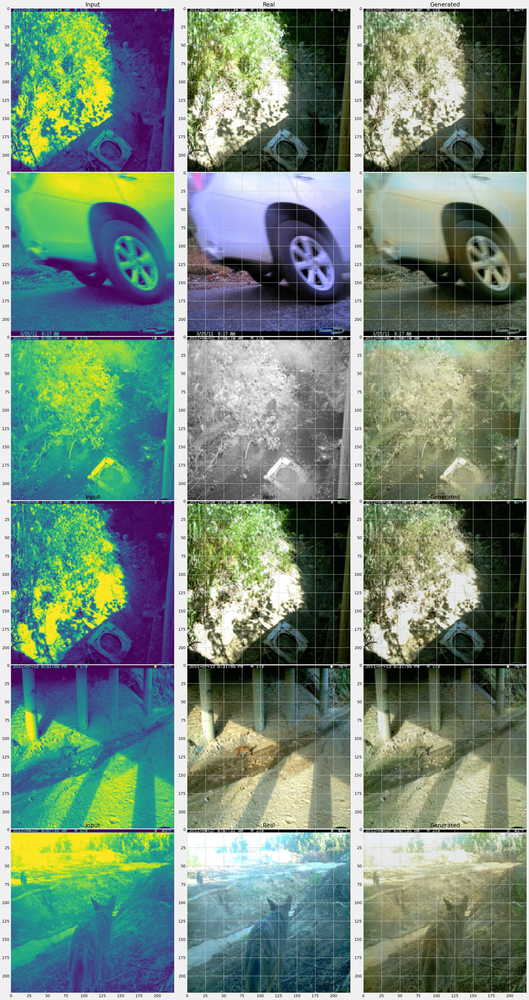

In [23]:
plt.figure(figsize=(30,60))
idx =1
for batch_idx, batch in enumerate(test_loader):
    real, condition = batch
    pred = gen(condition.to(device)).detach().squeeze().permute(1, 2, 0)
    condition  = condition.detach().squeeze(0).permute(1, 2, 0)
    real  = real.detach().squeeze(0).permute(1, 2, 0)
    plt.subplots_adjust(wspace=0, hspace=0)
    plt.subplot(6,3,idx)
    plt.grid(False)
    
    ab = torch.zeros((224,224,3))
    plt.imshow(condition)
    plt.title('Input')
    
    plt.subplot(6,3,idx + 1)
    plt.imshow(real)
    plt.title('Real')
    
    plt.subplot(6,3,idx + 2)
    plt.title('Generated')
    plt.imshow(pred.cpu())
    idx += 3
    if idx >= 18:
        break

In [24]:
img = Image.open("585a646c-23d2-11e8-a6a3-ec086b02610b.jpg")
img_gray = img.convert('L')


KeyboardInterrupt



In [ ]:
img_resized = img_gray.resize((224, 224))

# Convert the image to a numpy array
img_array = np.array(img_resized)

# Reshape array to add a channel dimension (224, 224) -> (224, 224, 1)
img_array = img_array.reshape((224, 224, 1))

# Convert the numpy array to a PyTorch tensor
tensor = transforms.ToTensor()(img_array)
tensor = tensor.unsqueeze(0)

predict = gen(tensor.to(device))

In [ ]:
pred = gen(tensor.to(device)).detach().squeeze().permute(1, 2, 0)
real  = tensor.detach().squeeze(0).permute(1, 2, 0)
plt.subplots_adjust(wspace=0, hspace=0)
plt.subplot(1,2,1)
plt.grid(False)

ab = torch.zeros((224,224,3))

plt.imshow(real)
plt.title('Input')

plt.subplot(1,2,2)
plt.imshow(pred.cpu())
plt.title('pred')


### Setting up the evaluation metric

In [25]:
class FID:
    def __init__(self, device):
        self.device = device
        self.inception = inception_v3(pretrained=True, transform_input=False).to(self.device)
        self.inception.eval()
        self.mu = None
        self.sigma = None

    def calculate_fid(self, real_images, generated_images):
        real_images = real_images.to(self.device)
        generated_images = generated_images.to(self.device)

        with torch.no_grad():
            real_features = self.inception(real_images.view(-1,3,224,224))
            generated_features = self.inception(generated_images.view(-1,3,224,224))

        real_features = real_features.view(real_features.size(0), -1)
        generated_features = generated_features.view(generated_features.size(0), -1)

        if self.mu is None:
            self.mu = real_features.mean(dim=0)

        if self.sigma is None:
            self.sigma = real_features.std(dim=0)

        real_mu = real_features.mean(dim=0)
        real_sigma = real_features.std(dim=0)

        generated_mu = generated_features.mean(dim=0)
        generated_sigma = generated_features.std(dim=0)

        mu_diff = real_mu - generated_mu
        sigma_diff = real_sigma - generated_sigma

        fid = mu_diff.pow(2).sum() + (self.sigma - generated_sigma).pow(2).sum() + (self.mu - generated_mu).pow(2).sum()
        return fid.item()

In [ ]:
tensor.size(),predict.size()

In [26]:
all_preds = []
all_real = []

for batch_idx, batch in enumerate(test_loader):
    real, condition = batch
    pred = gen(condition.to(device)).detach()
    all_preds.append(pred)
    all_real.append(real)

In [27]:

all_preds = torch.cat(all_preds, dim=0)
all_real = torch.cat(all_real, dim=0)

In [28]:
all_preds.shape,all_real.shape

(torch.Size([1000, 3, 224, 224]), torch.Size([1000, 3, 224, 224]))

In [29]:
device = "cuda" # or "cpu" if you don't have a GPU
fid_calculator = FID(device)

# Calculate the FID
fid_value = fid_calculator.calculate_fid(all_real, all_preds)

Downloading: "https://download.pytorch.org/models/inception_v3_google-0cc3c7bd.pth" to /root/.cache/torch/hub/checkpoints/inception_v3_google-0cc3c7bd.pth
100%|██████████| 104M/104M [00:00<00:00, 128MB/s]  


In [30]:
fid_value

140.38467407226562